### Loading the image

In [1]:
import cv2

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people1.jpg')

In [4]:
image.shape

(1280, 1920, 3)

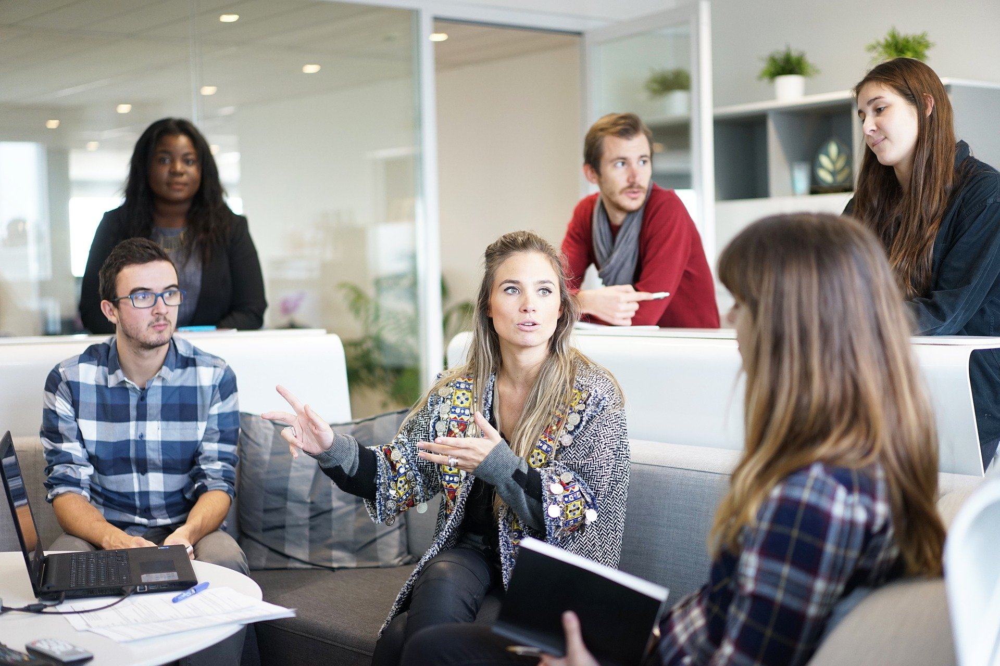

In [5]:
#cv2.imshow(image)
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [6]:
image = cv2.resize(image, (800, 600))
image.shape

(600, 800, 3)

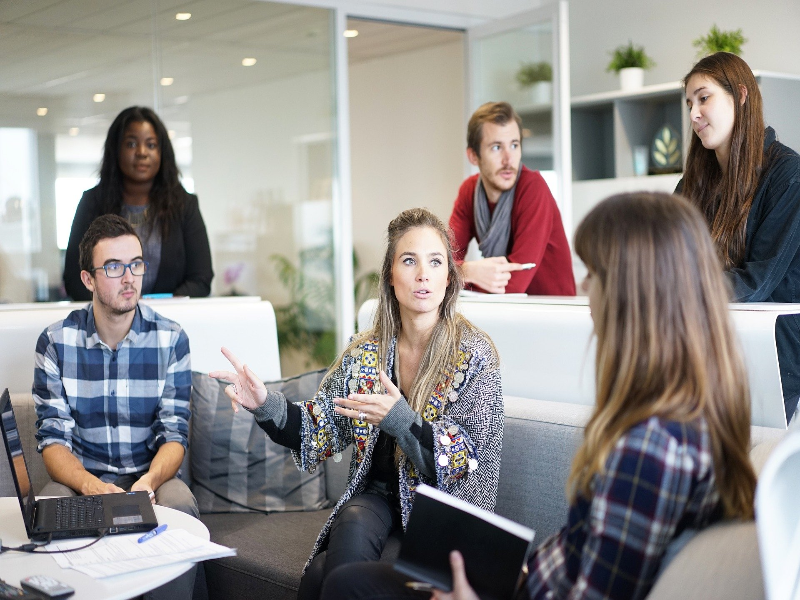

In [7]:
cv2_imshow(image)

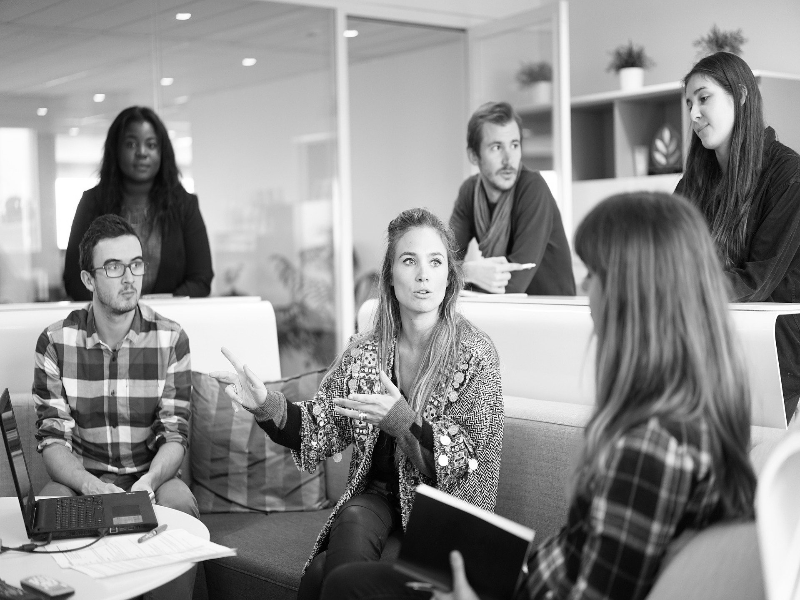

In [8]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [9]:
image.shape

(600, 800, 3)

In [10]:
image_gray.shape

(600, 800)

### Detecting faces

In [11]:
face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Data/Cascades/haarcascade_frontalface_default.xml')

In [12]:
detections = face_detector.detectMultiScale(image_gray)

In [13]:
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [14]:
len(detections)

6

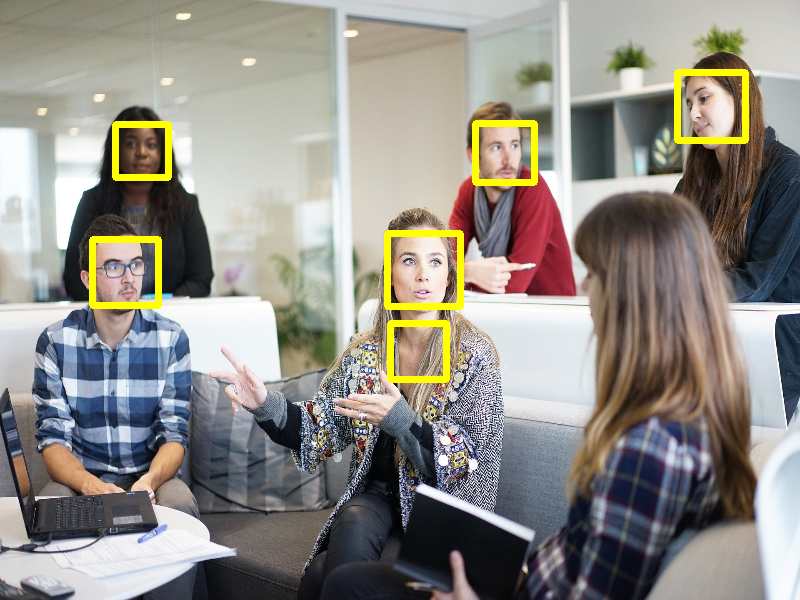

In [15]:
for (x, y, w, h) in detections:
  #print(x, y, w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,255), 5)  #cv2.rectangle(image, start_point, end_point, color, thickness)
cv2_imshow(image)

### Haarcascade parameters

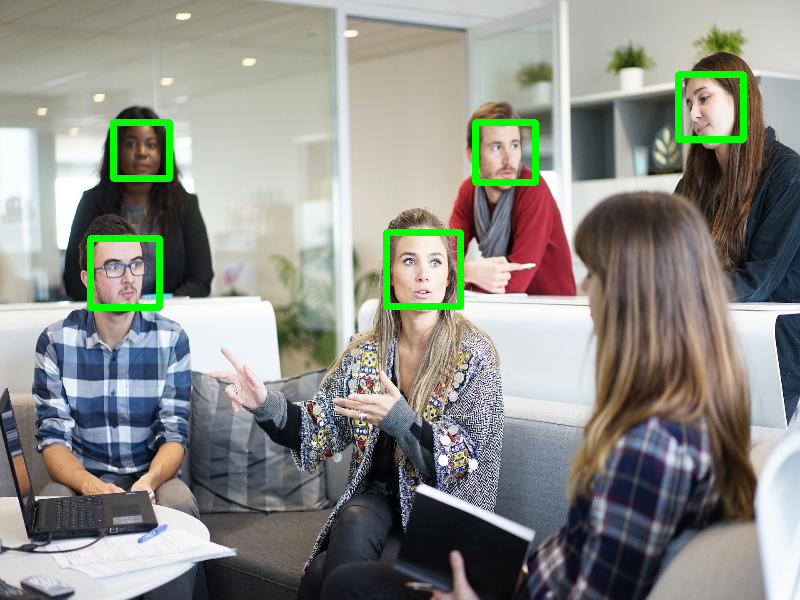

In [16]:
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people1.jpg')
image = cv2.resize(image, (800, 600))
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.09)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 5)
cv2_imshow(image)

47 47
47 47
49 49
49 49
52 52
51 51
46 46
44 44
51 51
50 50
51 51
47 47


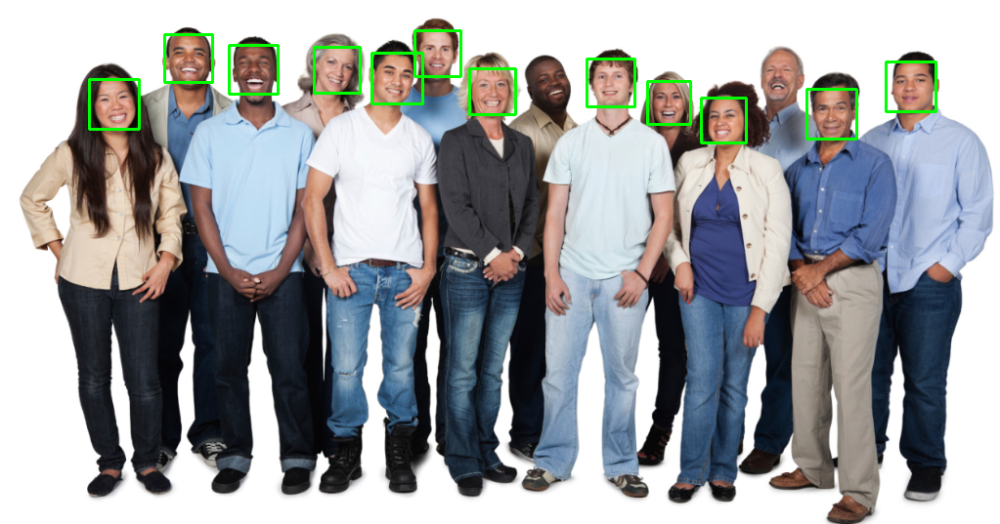

In [17]:
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people2.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = face_detector.detectMultiScale(image_gray, scaleFactor=1.2, minNeighbors=7,
                                            minSize=(20,20), maxSize=(100,100))
for (x, y, w, h) in detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

### Eye detection

In [18]:
eye_detector = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Data/Cascades/haarcascade_eye.xml')

(1280, 1920, 3)
38 38
37 37
24 24
25 25
36 36
43 43
24 24
26 26
39 39


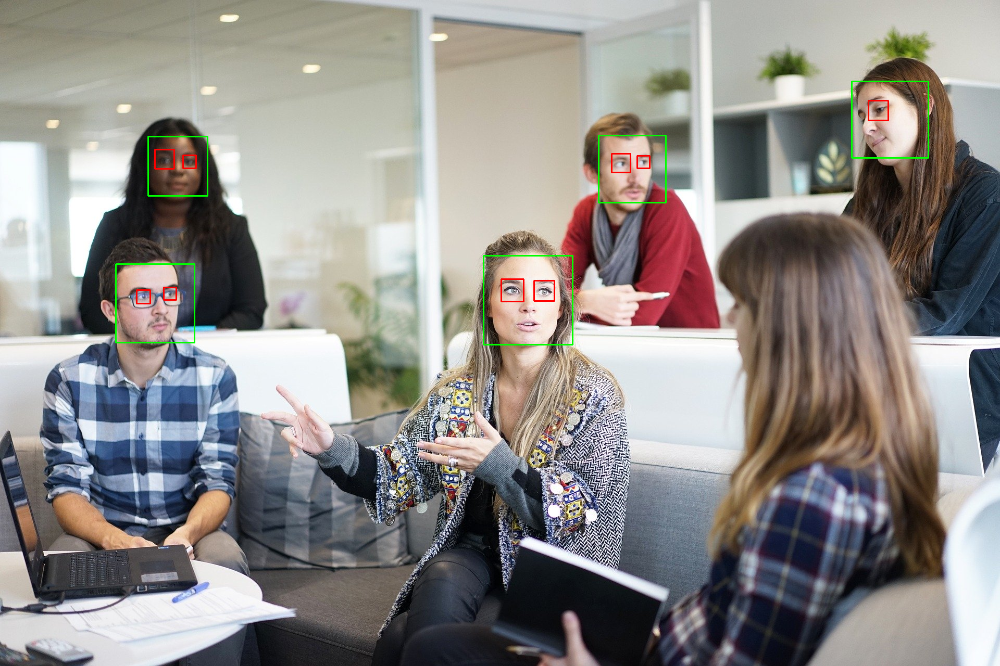

In [19]:
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people1.jpg')
#image = cv2.resize(image, (800, 600))
print(image.shape)
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detections = face_detector.detectMultiScale(image_gray, scaleFactor = 1.3, minSize = (30,30))
for (x, y, w, h) in face_detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)

eye_detections = eye_detector.detectMultiScale(image_gray, scaleFactor = 1.1, minNeighbors=10, maxSize=(70,70))
for (x, y, w, h) in eye_detections:
  print(w, h)
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,0,255), 2)

cv2_imshow(image)

### Other objects

#### Cars

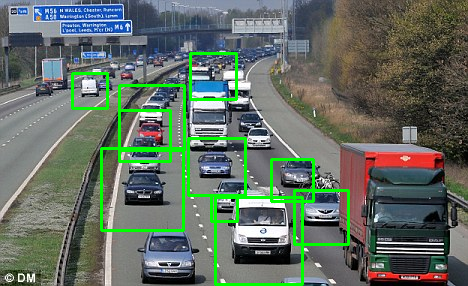

In [20]:
car_detector = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Data/Cascades/cars.xml')
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/car.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = car_detector.detectMultiScale(image_gray, scaleFactor=1.04, minNeighbors=2)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#### Clocks

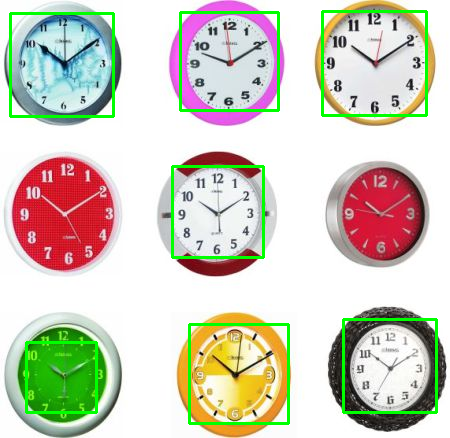

In [21]:
clock_detector = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Data/Cascades/clocks.xml')
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/clock.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = clock_detector.detectMultiScale(image_gray, scaleFactor = 1.03, minNeighbors=1)
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

#### Full body

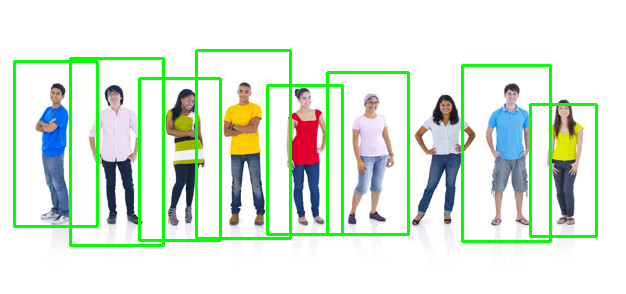

In [22]:
full_detector = cv2.CascadeClassifier('/content/drive/MyDrive/CV_Data/Cascades/fullbody.xml')
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people3.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
detections = full_detector.detectMultiScale(image_gray, scaleFactor = 1.05, minNeighbors=5,
                                              minSize = (50,50))
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 2)
cv2_imshow(image)

## Dlib

In [23]:
import dlib

### Detecting faces with HOG

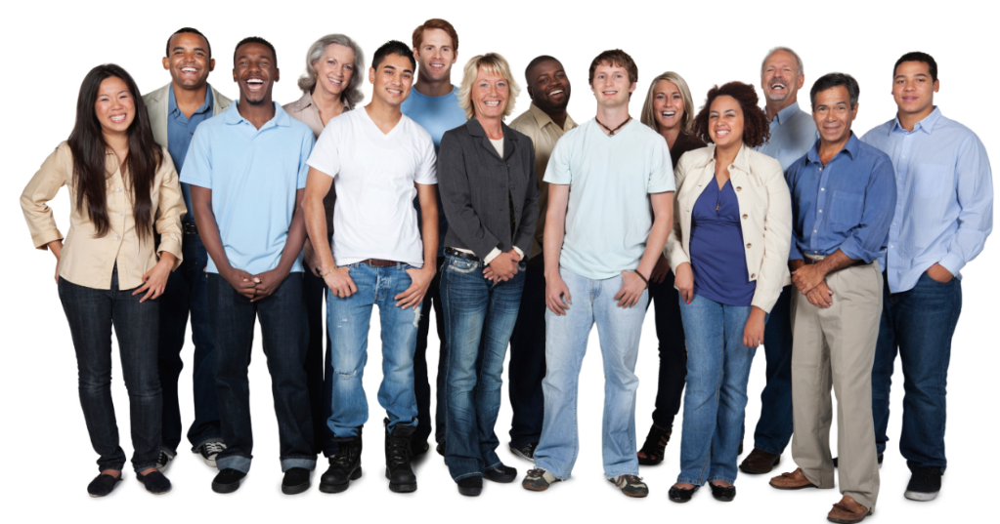

In [24]:
image = cv2.imread('/content/drive/MyDrive/CV_Data/Images/people2.jpg')
cv2_imshow(image)

In [25]:
face_detector_hog = dlib.get_frontal_face_detector()

In [26]:
detections = face_detector_hog(image, 1)

In [27]:
detections, len(detections)

(rectangles[[(429, 38) (465, 74)], [(665, 90) (701, 126)], [(717, 103) (760, 146)], [(909, 70) (952, 113)], [(828, 98) (871, 142)], [(605, 70) (641, 106)], [(777, 62) (813, 98)], [(485, 78) (521, 114)], [(386, 60) (429, 103)], [(170, 41) (213, 84)], [(93, 89) (136, 132)], [(237, 50) (280, 94)], [(323, 50) (367, 94)], [(544, 65) (588, 108)]],
 14)

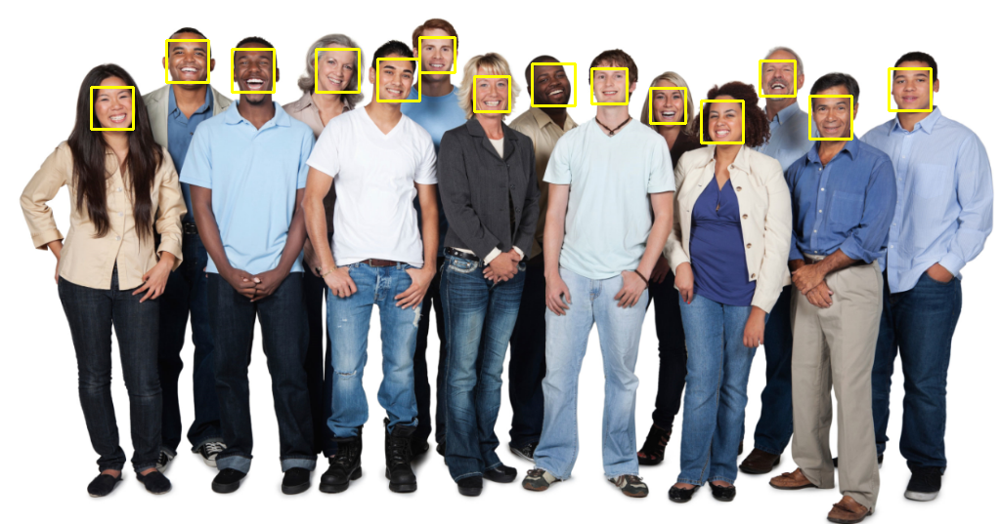

In [28]:
for face in detections:
  #print(face)
  #print(face.left())
  #print(face.top())
  #print(face.right())
  #print(face.bottom())
  l, t, r, b = face.left(), face.top(), face.right(), face.bottom()
  cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 2)
cv2_imshow(image)